 # Analysing eye tracking data
 We want to compare our eye tracking results with the
 boxes that we generated.

 Load in all the data...

In [1]:

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pickle

plt.rcParams['figure.dpi'] = 170

# Import data and images
gaze_df = pd.read_excel(
    r'D:\Users\Naim\OneDrive\CloudDocs\UNIVERSITY\S8\MPhys_s8\eyetracking_analysis\adjusted_gazedata.xlsx'
)

with open(
        r'D:\Users\Naim\OneDrive\CloudDocs\UNIVERSITY\S8\MPhys_s8\eyetracking_analysis\images_dict.pkl',
        'rb') as file:
    imgs_dict = pickle.load(file)


 ## Gaze heatmap
 To generate a gaze heatmap we draw 2D Gaussians centred on each fixation, with x & y variances respectively.
 The amplitude of each fixation is taken as the proportion that the fixation contributes to the total duration
 of gaze gathered for the image as a whole. (Note: This is *not* per recording)

 Group data by image.

In [2]:
gaze_byimage = {img_name: df for img_name, df in gaze_df.groupby('MediaName')}


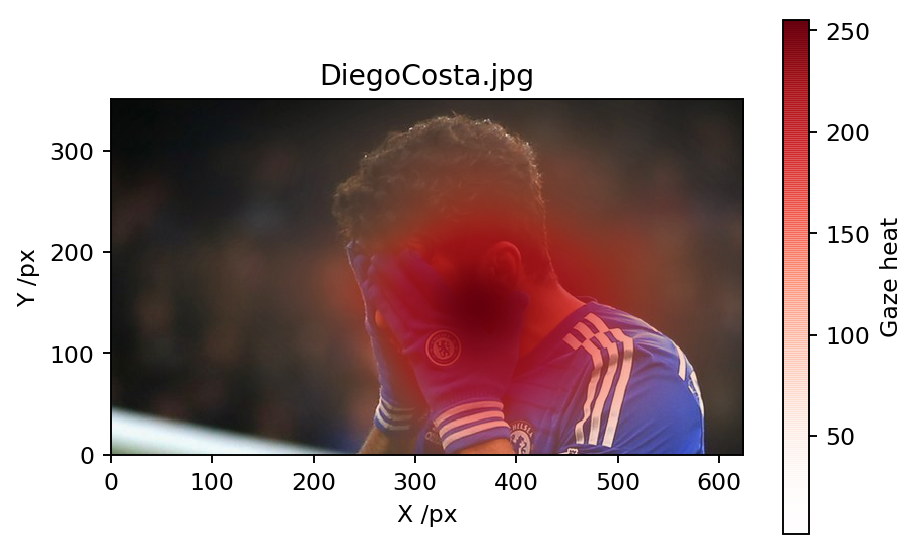

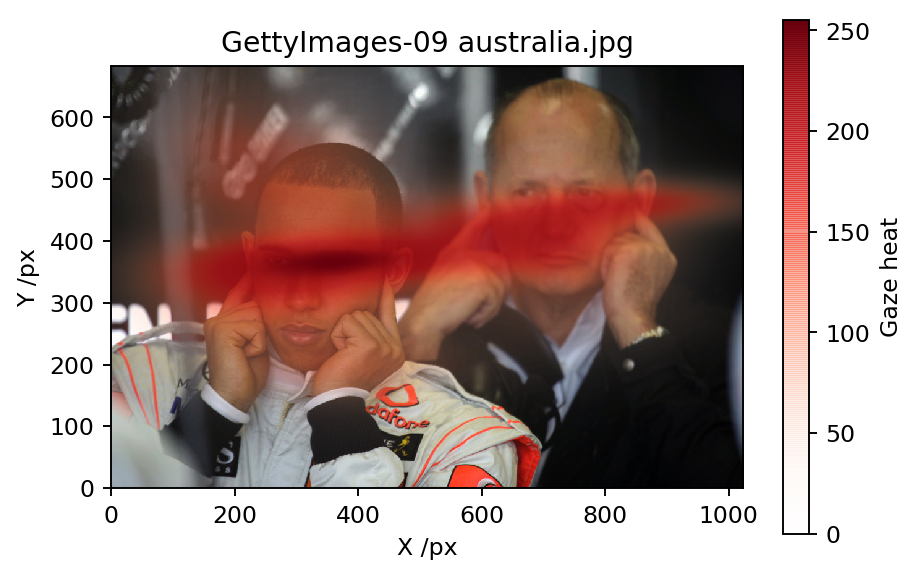

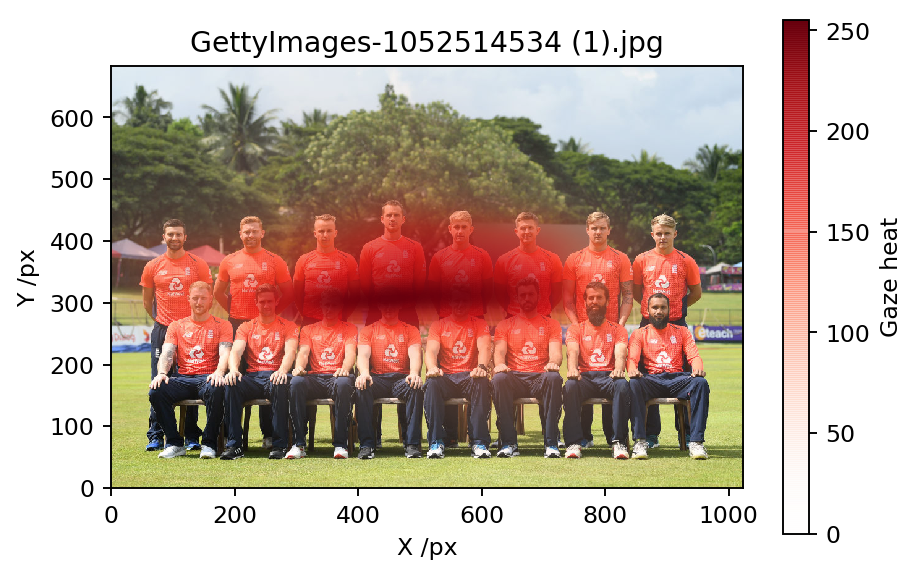

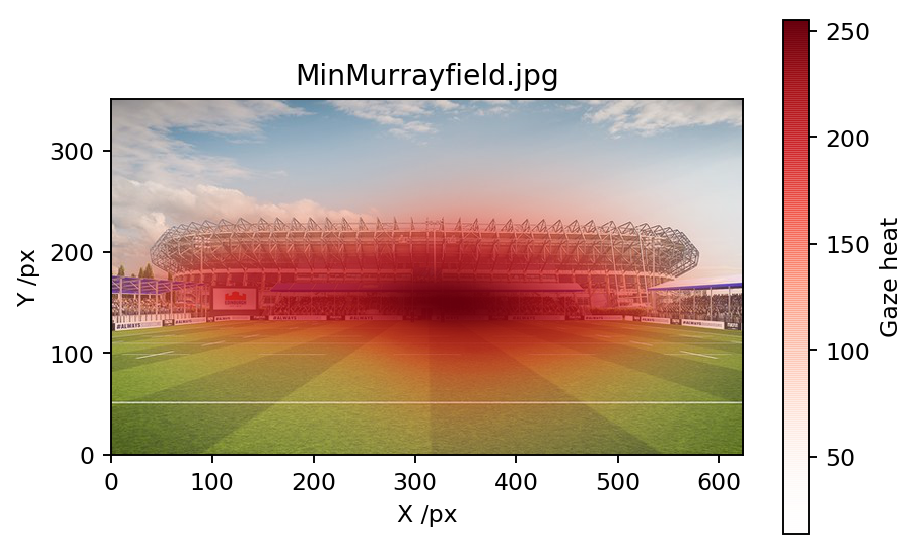

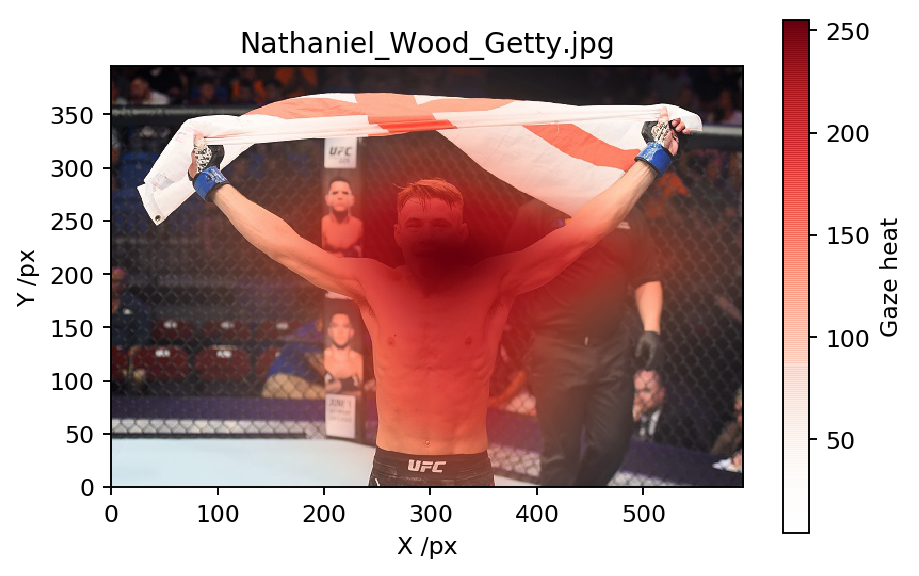

...

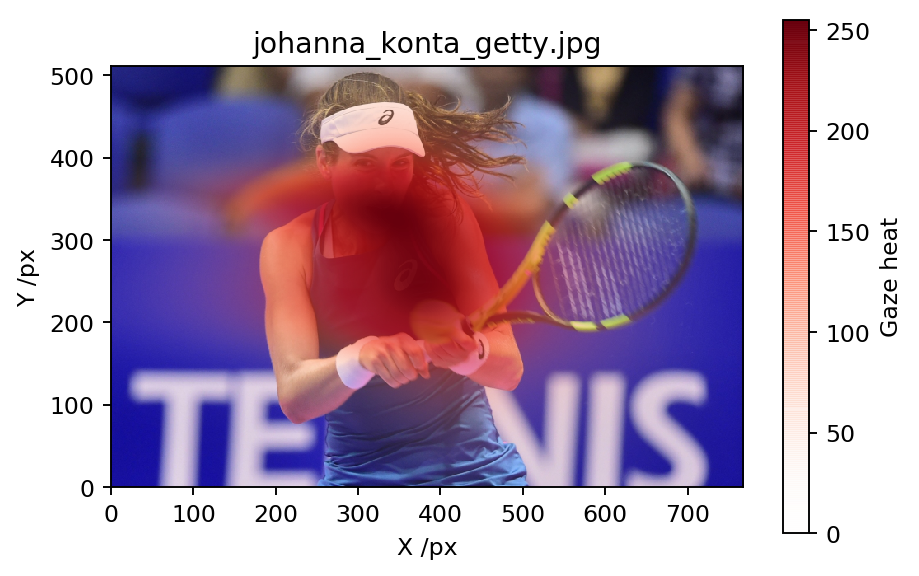

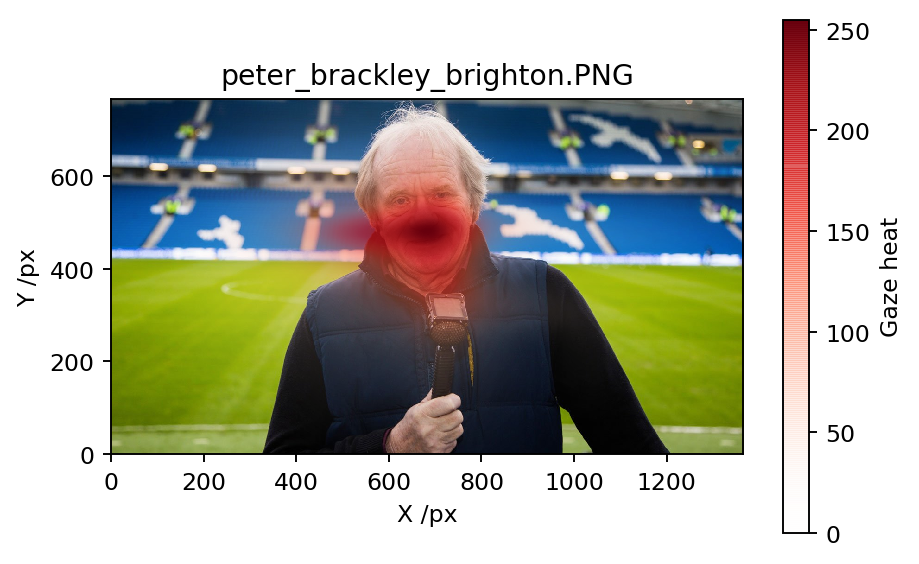

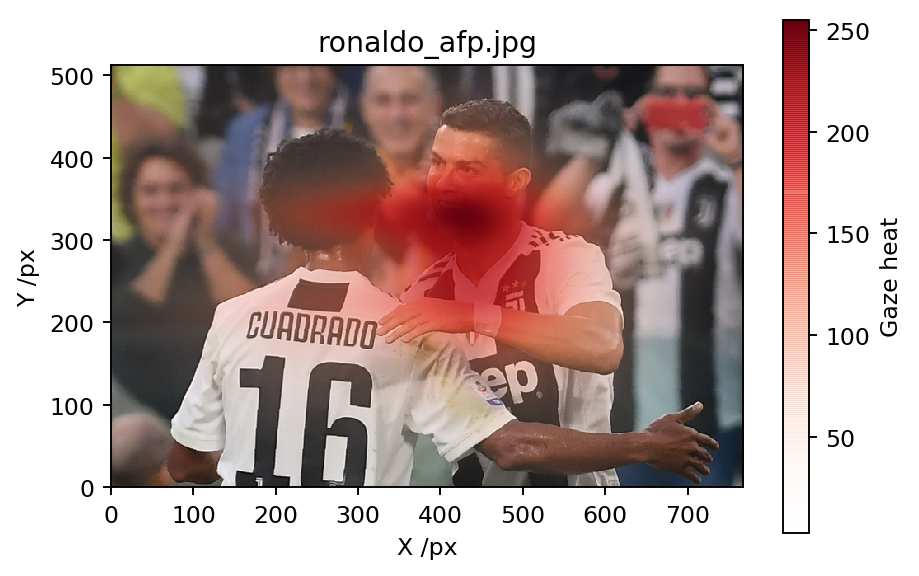

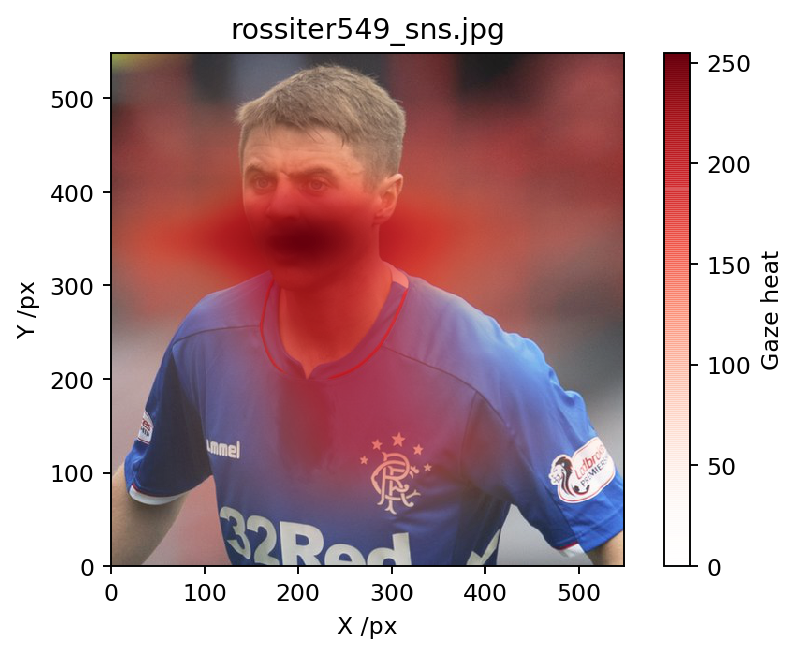

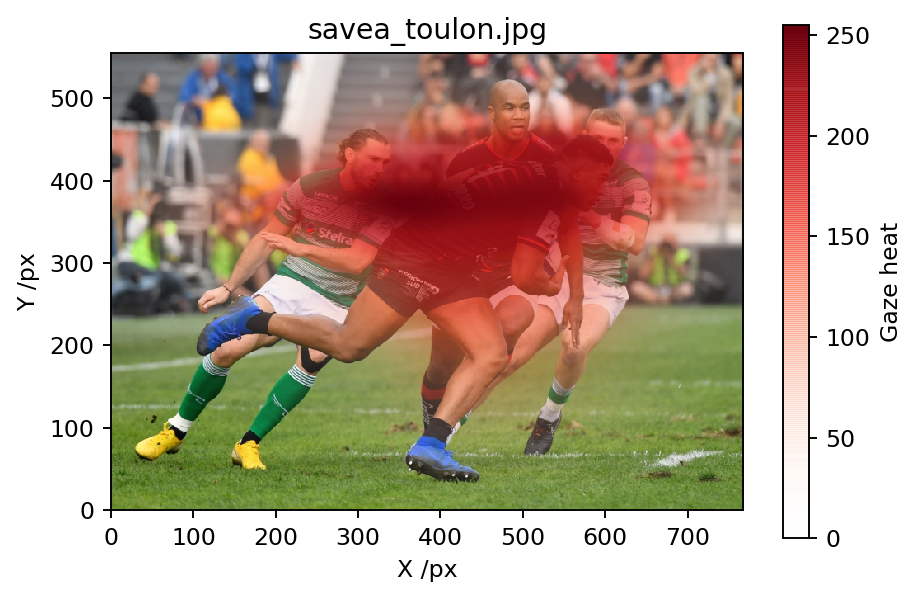

In [3]:
#from aptipy.analysis.utilities import draw_gauss2
import cv2
from mpl_toolkits.mplot3d import Axes3D


def draw_gauss2(gaze_map, datapoint, total_duration):
    x0 = datapoint.FixationPointX
    y0 = datapoint.FixationPointY
    xvar = datapoint.FixationPointXErr**2
    yvar = datapoint.FixationPointYErr**2
    A = datapoint.GazeEventDuration / total_duration

    img_xy = (datapoint.MediaWidth, datapoint.MediaHeight)

    x = np.linspace(0, img_xy[0], gaze_map.shape[0])
    y = np.linspace(0, img_xy[1], gaze_map.shape[0])

    xx, yy = np.meshgrid(x, y)

    datapoint_gauss = A * np.exp(-(((xx - x0)**2) / (2 * xvar) + (
        (yy - y0)**2) / (2 * yvar)))

    gaze_map += datapoint_gauss
    # plt.figure()
    # plt.contourf(x, y, datapoint_gauss)
    # plt.colorbar()
    # plt.xlim = img_xy[0]
    # plt.ylim = img_xy[1]
    # plt.errorbar(
    #     x0,
    #     y0,
    #     fmt='none',
    #     xerr=datapoint.FixationPointXErr,
    #     yerr=datapoint.FixationPointYErr)


# Define colormap with transparency so that the gaze_map can
# be plotted over an image
from matplotlib.colors import LinearSegmentedColormap

# get colormap
ncolors = 256
color_arr = plt.get_cmap('Reds')(range(ncolors))

# alpha values
color_arr[:, -1] = np.linspace(0., 1., ncolors)

# colormap obj
map_obj = LinearSegmentedColormap.from_list(
    name='Reds_alpha', colors=color_arr)
plt.register_cmap(cmap=map_obj)

# declare gazemap dictionary
gazemaps_byimage = dict()
# loop over images
for img_name, img_df in gaze_byimage.items():
    # create canvas
    gaze_map = np.zeros((2000, 2000))
    # compute total duration recorded
    duration = img_df['GazeEventDuration'].sum()
    i_ = 0
    # loop over fixations
    for row in img_df.itertuples():
        draw_gauss2(gaze_map, row, duration)

    # Add gazemap to dict
    gazemaps_byimage[img_name] = gaze_map

    # get image dims
    img_shape = imgs_dict[img_name].shape
    # resize image
    gaze_map = cv2.resize(gaze_map, (img_shape[1], img_shape[0]))
    gaze_map /= gaze_map.max()
    gaze_map *= 255
    gaze_map = gaze_map.astype(np.uint8)

    savepath = r'D:\Users\Naim\OneDrive\CloudDocs\UNIVERSITY\S8\MPhys_s8\eyetracking_analysis' + '\\gazemaps\\' + 'gazemap_' + img_name
    #cv2.imwrite(savepath, gaze_map)
    plt.figure()
    plt.imshow(imgs_dict[img_name], extent=[0, img_shape[1], 0, img_shape[0]])
    plt.imshow(
        gaze_map, extent=[0, img_shape[1], 0, img_shape[0]], cmap='Reds_alpha')
    plt.colorbar(label='Gaze heat')
    plt.xlabel('X /px')
    plt.ylabel('Y /px')
    plt.title(img_name)
